<a href="https://colab.research.google.com/github/Sakshi-Pingale/-LGMVIP-DataScience/blob/main/beginner_task_1(music_recomm).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install spotipy
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
from spotipy.oauth2 import SpotifyClientCredentials
import spotipy
from collections import defaultdict
from yellowbrick.target import FeatureCorrelation


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.1/252.1 kB 7.2 MB/s eta 0:00:00


In [ ]:
# Set your Spotify credentials
os.environ["SPOTIFY_CLIENT_ID"] = 'your_spotify_client_id'
os.environ["SPOTIFY_CLIENT_SECRET"] = 'your_spotify_client_secret'


In [ ]:
# Load data
data = pd.read_csv('/content/data.csv')
genre_data = pd.read_csv('/content/data_by_genres.csv')
year_data = pd.read_csv('/content/data_by_year.csv')


In [ ]:
# Print data info
print(data.info())
print(genre_data.info())
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42361 entries, 0 to 42360
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   valence           42361 non-null  float64
 1   year              42361 non-null  int64  
 2   acousticness      42361 non-null  float64
 3   artists           42361 non-null  object 
 4   danceability      42361 non-null  float64
 5   duration_ms       42361 non-null  int64  
 6   energy            42361 non-null  float64
 7   explicit          42361 non-null  int64  
 8   id                42361 non-null  object 
 9   instrumentalness  42361 non-null  float64
 10  key               42361 non-null  int64  
 11  liveness          42361 non-null  float64
 12  loudness          42360 non-null  float64
 13  mode              42360 non-null  float64
 14  name              42360 non-null  object 
 15  popularity        42360 non-null  float64
 16  release_date      42360 non-null  object

<ipython-input-7-cc760e06804e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-7-cc760e06804e>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.dropna(inplace=True)


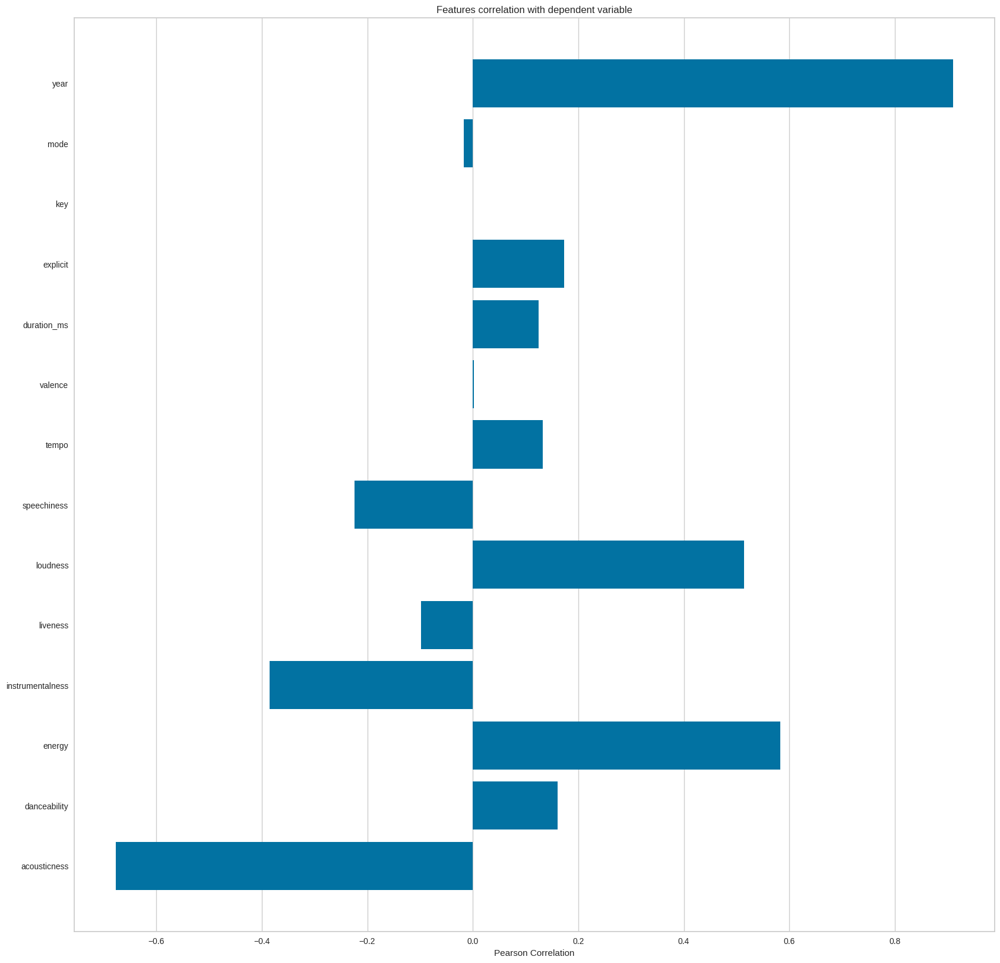

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
# Feature correlation visualization
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
                 'liveness', 'loudness', 'speechiness', 'tempo', 'valence',
                 'duration_ms', 'explicit', 'key', 'mode', 'year']

X, y = data[feature_names], data['popularity']

# Check for NaNs and Infs in the data
X.replace([np.inf, -np.inf], np.nan, inplace=True)
X.dropna(inplace=True)

# Ensure the corresponding rows in y are also dropped
y = y.loc[X.index]

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize'] = (20, 20)
visualizer.fit(X, y)  # Fit the data to the visualizer
visualizer.show()



In [ ]:
# Add decade column
def get_decade(year):
    return f"{(year // 10) * 10}s"

data['decade'] = data['year'].apply(get_decade)

<Axes: xlabel='count', ylabel='decade'>

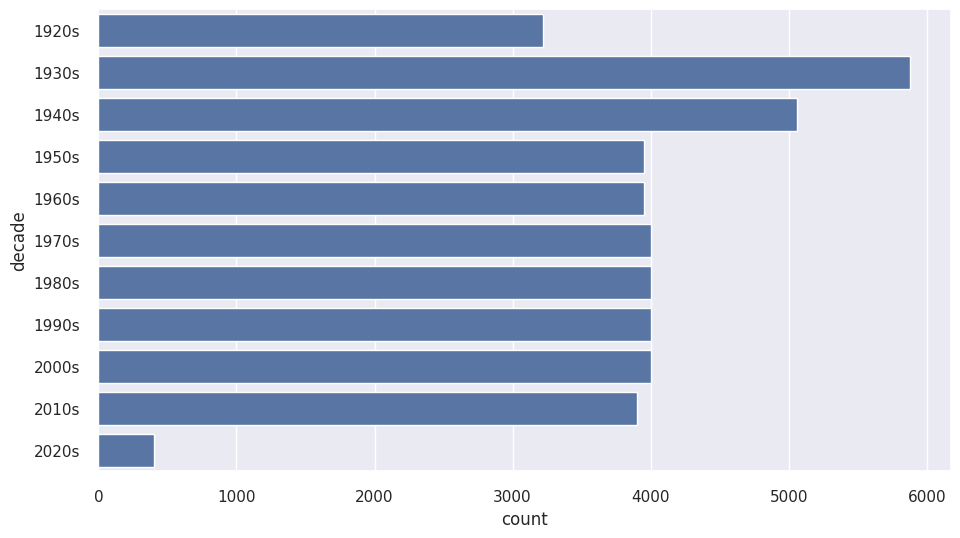

In [ ]:
# Decade count plot
sns.set(rc={'figure.figsize': (11, 6)})
sns.countplot(data['decade'])

In [ ]:
# Sound features line plot
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
# Top 10 genres bar plot
top10_genres = genre_data.nlargest(10, 'popularity')
fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [ ]:
# Clustering genres
X_genres = genre_data.select_dtypes(np.number)
cluster_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('kmeans', KMeans(n_clusters=10))])
genre_data['cluster'] = cluster_pipeline.fit_predict(X_genres)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
# t-SNE visualization
tsne_pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('tsne', TSNE(n_components=2, verbose=1))
])
genre_embedding = tsne_pipeline.fit_transform(X_genres)
projection = pd.DataFrame(genre_embedding, columns=['x', 'y'])
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.331s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106339
[t-SNE] KL divergence after 1000 iterations: 1.392668


In [ ]:
# Drop rows with missing values
X = data.select_dtypes(np.number)
X.dropna(inplace=True)

# Ensure the corresponding rows in data are also dropped
data = data.loc[X.index]

# Proceed with clustering
number_cols = list(X.columns)
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20, verbose=False))], verbose=False)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels



/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:

# Replace NaNs with column mean
X_songs = data.select_dtypes(np.number)

# Define the pipeline with SimpleImputer, StandardScaler, and PCA
pca_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),
    ('PCA', PCA(n_components=2))
])

# Apply the pipeline to the data
song_embedding = pca_pipeline.fit_transform(X_songs)

# Create a DataFrame for the PCA results
projection = pd.DataFrame(song_embedding, columns=['x', 'y'])
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

# Plot the PCA results using Plotly
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()


In [ ]:
import os
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# Ensure your credentials are correctly set
os.environ["SPOTIFY_CLIENT_ID"] = "b728c756e1034fa69dae9c070f03270d"
os.environ["SPOTIFY_CLIENT_SECRET"] = "6416ec02ba524362b708fd78bebce7a3"

# Initialize Spotify API client
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(
    client_id=os.environ["SPOTIFY_CLIENT_ID"],
    client_secret=os.environ["SPOTIFY_CLIENT_SECRET"]
))

# Test the setup by searching for a track
track = sp.search(q='track: Shape of You', limit=1)
print(track)


{'tracks': {'href': 'https://api.spotify.com/v1/search?query=track%3A+Shape+of+You&type=track&offset=0&limit=1', 'items': [{'album': {'album_type': 'album', 'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/42QKiNCqr36B0gfgETuA9t'}, 'href': 'https://api.spotify.com/v1/artists/42QKiNCqr36B0gfgETuA9t', 'id': '42QKiNCqr36B0gfgETuA9t', 'name': 'Tiny Tracks', 'type': 'artist', 'uri': 'spotify:artist:42QKiNCqr36B0gfgETuA9t'}], 'available_markets': ['AR', 'AU', 'AT', 'BE', 'BO', 'BR', 'BG', 'CA', 'CL', 'CO', 'CR', 'CY', 'CZ', 'DK', 'DO', 'DE', 'EC', 'EE', 'SV', 'FI', 'FR', 'GR', 'GT', 'HN', 'HK', 'HU', 'IS', 'IE', 'IT', 'LV', 'LT', 'LU', 'MY', 'MT', 'MX', 'NL', 'NZ', 'NI', 'NO', 'PA', 'PY', 'PE', 'PH', 'PL', 'PT', 'SG', 'SK', 'ES', 'SE', 'CH', 'TW', 'TR', 'UY', 'US', 'GB', 'AD', 'LI', 'MC', 'ID', 'JP', 'TH', 'VN', 'RO', 'IL', 'ZA', 'SA', 'AE', 'BH', 'QA', 'OM', 'KW', 'EG', 'MA', 'DZ', 'TN', 'LB', 'JO', 'PS', 'IN', 'BY', 'KZ', 'MD', 'UA', 'AL', 'BA', 'HR', 'ME', 'MK', 

In [ ]:

# Function to find song on Spotify
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q='track: {} year: {}'.format(name, year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)



In [ ]:
# Define the columns to be used
number_cols = ['acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
               'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity',
               'speechiness', 'tempo', 'valence', 'year']

In [ ]:
# Function to get song data
def get_song_data(song, spotify_data):
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data
    except IndexError:
        return find_song(song['name'], song['year'])

In [ ]:
# Function to get mean vector
def get_mean_vector(song_list, spotify_data):
    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print(f'Warning: Missing data for {song["name"]}')
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(song_vectors)
    return np.mean(song_matrix, axis=0)


In [ ]:
# Function to flatten dictionary list
def flatten_dict_list(dict_list):
    flattened_dict = defaultdict(list)
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
    return flattened_dict


In [ ]:
# Function to recommend songs
def recommend_songs(song_list, spotify_data, n_songs=10):
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
# Example data (replace with your actual data)
data = pd.read_csv('/content/data.csv')  # Update with your actual data path
data = data.dropna(subset=number_cols)  # Ensure there are no NaN values in the feature columns

# Clustering pipeline
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20, random_state=42))])
X = data[number_cols]
song_cluster_pipeline.fit(X)
data['cluster_label'] = song_cluster_pipeline.predict(X)




/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [ ]:
# Example usage of the recommendation function
recommended_songs = recommend_songs([
    {'name': 'Come As You Are', 'year': 1991},
    {'name': 'Smells Like Teen Spirit', 'year': 1991},
    {'name': 'All Apologies', 'year': 1993},
    {'name': 'Lithium', 'year': 1992},
], data)

print(recommended_songs)

[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"}, {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"}, {'name': "Breakfast At Tiffany's", 'year': 1995, 'artists': "['Deep Blue Something']"}, {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"}, {'name': "It's Not Living (If It's Not With You)", 'year': 2018, 'artists': "['The 1975']"}, {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"}, {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"}, {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"}, {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"}, {'name': "Club Can't Handle Me (feat. David Guetta)", 'year': 2010, 'artists': "['Flo Rida', 'David Guetta']"}]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names

